In [2]:
# import necessary libraries
import pandas as pd
import numpy as np
import ast
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import os
import sys

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
% matplotlib inline

nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)

from src.topics import topic_dist
from src.topics import topic_funcs
from src.topics import topic_dist
from src.vis import wordcloud_vis as wcv
from scipy.stats import ttest_rel

from nltk.collocations import BigramAssocMeasures, TrigramAssocMeasures, QuadgramCollocationFinder, BigramCollocationFinder, TrigramCollocationFinder
from nltk import word_tokenize, FreqDist, bigrams
from bokeh.plotting import figure, show, output_notebook, output_file
from bokeh.models import ColumnDataSource, LabelSet, Jitter, HoverTool, Range1d, LinearAxis
from bokeh.palettes import GnBu3, OrRd3
from bokeh.core.properties import value
from bokeh.transform import dodge, jitter
from bokeh.layouts import gridplot
from bokeh.io import export_png

from wordcloud import WordCloud, ImageColorGenerator

import gensim
from gensim import corpora
import logging
from six import itervalues

output_notebook()

Loading BokehJS ...

In [3]:
# Load in data
df = pd.read_csv('../data/processed/reviews.csv', index_col=0)
review_counts = df['ProductId'].value_counts().sort_values()
top_ten = review_counts.tail(10).index.values

vanilla_final_results = pd.read_csv('../data/processed/vanilla_final_results.csv')
vanilla_final_results.set_index('product', inplace=True)

coded_final_results = pd.read_csv('../data/processed/coded_final_results.csv')
coded_final_results.set_index('product', inplace=True)

valence_final_results = pd.read_csv('../data/processed/valence_final_results.csv')
valence_final_results.set_index('product', inplace=True)

vanilla_topic_data = pd.read_csv('../data/processed/vanilla_topic_data.csv')
coded_topic_data = pd.read_csv('../data/processed/coded_topic_data.csv')
valence_topic_data = pd.read_csv('../data/processed/valence_topic_data.csv')

## Star Rating Prediction Power

### Codeword Counts
A typical way to assess analysis of online reviews is to observe the model's predictive power against the star rating (or other quantitative measure) of the reviews. In justifying his codeword approach, Jack Linshi reported that a simple linear regression of the counts of positive and negative codewords was able to predict the Yelp review's star rating to within 0.91 stars. He notes that better performance is unlikely since human reviewers would probably not come to a closer agreement, based on other studies.

To get an initial sense of whether using valence codewords has added additional predictive power, I'll do similar regression analysis. 

For the coded input, I'm doing a linear regression by product, by review, using the counts of the codewords "GOODREVIEW" and "BADREVIEW" in each review to predict the review's star rating. For the valence coded input, the independent variables are the counts of the codewords "VGOODREVIEW," "GOODREVIEW," "VBADREVIEW," and "BADREVIEW."

Due to the highly imbalanced nature of the review sets, I'm upsampling all of the minority classes. 

In [229]:
score_diff_coded = []
r2_coded = []
score_diff_valence = []
r2_valence = []
t_stats = []
p_vals = []
for product in top_ten:
    data = df.loc[df["ProductId"]==product]
    star_counts = df.loc[df['ProductId']==product, 'Score'].value_counts()
    top_count = max(star_counts.values)
    top = star_counts[star_counts==top_count].index[0]
    stars = list(star_counts.index.values)
    stars.remove(top)
    majority = data.loc[data['Score']==top]
    data_upsampled = majority.copy()
    
    for s in stars:
        minority = data.loc[data['Score']==s]
    
        minority_up = resample(minority, replace=True,
                              n_samples=len(majority),
                               random_state=42)
        data_upsampled=pd.concat([data_upsampled, minority_up])
        
    
    
    coded_regression = data_upsampled[['Topic Mixtures Coded', 'Score', 'Sentiment',
                                      'codecount_GOOD', 'codecount_BAD']]
    for t in range(coded_final_results.loc[product, 'num_topics']):
        coded_regression[t] = coded_regression['Topic Mixtures Coded'].apply(lambda x: ast.literal_eval(x)[t])
    #X = coded_regression[[x for x in range(coded_final_results.loc[product, 'num_topics'])]]
    X_c = coded_regression[['codecount_GOOD', 'codecount_BAD']]
    y_c = coded_regression['Score']
    reg_c = LinearRegression().fit(X_c, y_c)
    pred_c = reg_c.predict(X_c)
    diffs_c = np.abs(y_c-pred_c)
    avg_diff_c = np.mean(diffs_c)
    r2_c = reg_c.score(X_c, y_c)
    score_diff_coded.append(avg_diff_c)
    r2_coded.append(r2_c)
    
    
    valence_regression = data_upsampled[['ProductId','Topic Mixtures Valence', 'Score', 
                                     'Sentiment', 'valencecount_GOOD', 'valencecount_VGOOD', 
                                     'valencecount_BAD', 'valencecount_VBAD']]

    for t in range(valence_final_results.loc[product, 'num_topics']):
        valence_regression[t] = valence_regression['Topic Mixtures Valence'].apply(lambda x: ast.literal_eval(x)[t])
    #X = valence_regression[[x for x in range(valence_final_results.loc[product, 'num_topics'])]]
    X_v = valence_regression[['valencecount_GOOD', 'valencecount_VGOOD', 
                            'valencecount_BAD', 'valencecount_VBAD']]

    y_v = valence_regression['Score']
    reg_v = LinearRegression().fit(X_v, y_v)
    pred_v = reg_v.predict(X_v)
    diffs_v = np.abs(y_v-pred_v)
    avg_diff_v = np.mean(diffs_v)
    r2_v = reg_v.score(X_v, y_v)
    score_diff_valence.append(avg_diff_v)
    r2_valence.append(r2_v)
    t_stat, p_val = ttest_rel(diffs_c, diffs_v)
    t_stats.append(t_stat)
    p_vals.append(p_val)
    

results = pd.DataFrame(index=top_ten, data={'Avg Score Diff - Coded': score_diff_coded, 
                                            'Avg Score Diff - Valence': score_diff_valence,
                                            'R2 - Coded': r2_coded, 'R2 - Valence': r2_valence,
                                           't_stat': t_stats, 'p_val': p_vals})
results

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,Avg Score Diff - Coded,Avg Score Diff - Valence,R2 - Coded,R2 - Valence,p_val,t_stat
B002IEZJMA,1.022222,0.987037,0.239499,0.292767,9.750233e-05,3.914839
B006MONQMC,1.087983,1.019241,0.189106,0.262805,1.410562e-09,6.118239
B005ZBZLT4,1.016389,0.969103,0.256098,0.310939,1.458489e-10,6.448190
B003GTR8IO,0.958230,0.915746,0.323831,0.365044,1.551807e-07,5.285567
B005K4Q34S,1.058872,0.949178,0.213636,0.325040,7.175536e-24,10.244989
B0013A0QXC,1.093235,1.028903,0.146099,0.223652,1.705131e-13,7.426488
B000NMJWZO,1.109480,1.105521,0.158164,0.165802,1.084965e-01,1.605560
B000KV61FC,1.120367,1.076863,0.126999,0.183014,1.834448e-05,4.305300
B001EO5Q64,0.962651,0.887011,0.312179,0.396951,4.082530e-22,9.766255
B0026RQTGE,1.043742,0.975907,0.260710,0.332009,5.666895e-21,9.481092


The results table shows the r-squared value for the regression analysis for each product, along with how close the model comes, on average, to predicting the review's star rating based on the codeword counts. 

The results are consistently better with the valence codewords, save for one product. Examining the average absolute difference between the true score and the predicted score, a t-test confirms that the difference is statistically significant at the 1% level in all cases except one (even for the product where the results are reversed, interestingly). 

### Topic Mixtures

What about the topic mixture values? How powerful are these in predicting star ratings? 

In [150]:
score_diff_vanilla = []
r2_vanilla = []
score_diff_coded = []
r2_coded = []
score_diff_valence = []
r2_valence = []
t_stats = []
p_vals = []
for product in top_ten:
    data = df.loc[df["ProductId"]==product]
    star_counts = df.loc[df['ProductId']==product, 'Score'].value_counts()
    top_count = max(star_counts.values)
    top = star_counts[star_counts==top_count].index[0]
    stars = list(star_counts.index.values)
    stars.remove(top)
    majority = data.loc[data['Score']==top]
    data_upsampled = majority.copy()
    
    for s in stars:
        minority = data.loc[data['Score']==s]
    
        minority_up = resample(minority, replace=True,
                              n_samples=len(majority),
                               random_state=42)
        data_upsampled=pd.concat([data_upsampled, minority_up])
        

    vanilla_regression = data_upsampled[['Topic Mixtures Vanilla', 'Score', 'Sentiment',
                                      'codecount_GOOD', 'codecount_BAD']]
    for t in range(vanilla_final_results.loc[product, 'num_topics']):
        vanilla_regression[t] = vanilla_regression['Topic Mixtures Vanilla'].apply(lambda x: ast.literal_eval(x)[t])
    X = vanilla_regression[[x for x in range(vanilla_final_results.loc[product, 'num_topics'])]]
    y = vanilla_regression['Score']
    reg = LinearRegression().fit(X, y)
    pred = reg.predict(X)
    diffs = np.abs(y-pred)
    avg_diff = np.mean(diffs)
    r2 = reg.score(X, y)
    score_diff_vanilla.append(avg_diff)
    r2_vanilla.append(r2)        
        
    
    coded_regression = data_upsampled[['Topic Mixtures Coded', 'Score', 'Sentiment',
                                      'codecount_GOOD', 'codecount_BAD']]
    for t in range(coded_final_results.loc[product, 'num_topics']):
        coded_regression[t] = coded_regression['Topic Mixtures Coded'].apply(lambda x: ast.literal_eval(x)[t])
    X_c = coded_regression[[x for x in range(coded_final_results.loc[product, 'num_topics'])]]
    y_c = coded_regression['Score']
    reg_c = LinearRegression().fit(X_c, y_c)
    pred_c = reg_c.predict(X_c)
    diffs_c = np.abs(y_c-pred_c)
    avg_diff_c = np.mean(diffs_c)
    r2_c = reg_c.score(X_c, y_c)
    score_diff_coded.append(avg_diff_c)
    r2_coded.append(r2_c)
    
    
    valence_regression = data_upsampled[['ProductId','Topic Mixtures Valence', 'Score', 
                                     'Sentiment', 'valencecount_GOOD', 'valencecount_VGOOD', 
                                     'valencecount_BAD', 'valencecount_VBAD']]

    for t in range(valence_final_results.loc[product, 'num_topics']):
        valence_regression[t] = valence_regression['Topic Mixtures Valence'].apply(lambda x: ast.literal_eval(x)[t])
    X_v = valence_regression[[x for x in range(valence_final_results.loc[product, 'num_topics'])]]
    y_v = valence_regression['Score']
    reg_v = LinearRegression().fit(X_v, y_v)
    pred_v = reg_v.predict(X_v)
    diffs_v = np.abs(y_v-pred_v)
    avg_diff_v = np.mean(diffs_v)
    r2_v = reg_v.score(X_v, y_v)
    score_diff_valence.append(avg_diff_v)
    r2_valence.append(r2_v)
    #t_stat, p_val = ttest_rel(diffs_c, diffs_v)
    #t_stats.append(t_stat)
    #p_vals.append(p_val)
    

results = pd.DataFrame(index=top_ten, data={'Avg Score Diff - Vanilla': score_diff_vanilla,
                                            'R2 - Vanilla': r2_vanilla, 'Avg Score Diff - Coded': score_diff_coded, 
                                            'Avg Score Diff - Valence': score_diff_valence,
                                            'R2 - Coded': r2_coded, 'R2 - Valence': r2_valence})
results

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/

,Avg Score Diff - Coded,Avg Score Diff - Valence,Avg Score Diff - Vanilla,R2 - Coded,R2 - Valence,R2 - Vanilla
B002IEZJMA,1.106234,1.092839,1.092449,0.169676,0.173518,0.177796
B006MONQMC,1.094165,1.097788,1.056471,0.160942,0.172629,0.235159
B005ZBZLT4,1.130108,1.048181,1.117825,0.100033,0.177513,0.120238
B003GTR8IO,1.145834,1.152897,1.196997,0.108923,0.083140,0.031475
B005K4Q34S,1.191872,1.176532,1.096679,0.049121,0.050959,0.165553
B0013A0QXC,1.117024,1.101724,1.156979,0.123001,0.148739,0.068971
B000NMJWZO,0.971000,0.899784,0.886920,0.309627,0.366740,0.431954
B000KV61FC,1.088808,1.178523,1.161497,0.158640,0.041811,0.084074
B001EO5Q64,0.931529,1.096582,1.016204,0.299112,0.184899,0.248216
B0026RQTGE,0.891931,1.024590,1.107025,0.390949,0.242859,0.127871


These results look a little muddier...easier to see in a chart. 

In [183]:
source = ColumnDataSource(data = {'products': results.index.values,
                                 'vanilla': results['Avg Score Diff - Vanilla'],
                                 'coded': results['Avg Score Diff - Coded'],
                                 'valence': results['Avg Score Diff - Valence']})
p = figure(x_range=top_ten, y_range=[0.8, 1.3], plot_height=400, plot_width=550,
           title="Average Score Difference (True vs Predicted)")

p.vbar(x=dodge('products', -0.25, range=p.x_range),
               top='vanilla', width=0.3,
               source=source, color='#718dbf', legend=value('Vanilla Reviews'))
        
p.vbar(x=dodge('products', 0.0, range=p.x_range),
       top='coded', width=0.3,
       source=source, color='#c9d9d3', legend=value('Coded Reviews'))
        
p.vbar(x=dodge('products',  0.25, range=p.x_range), 
               top='valence', width=0.3, source=source,
               color='#e84d60', legend=value('Valence Coded Reviews'))

p.legend.location ='bottom_left'
p.legend.label_text_font_size='7pt'
p.xaxis.major_label_orientation = 0.75

show(p)

In three cases, the vanilla review topic mixtures actually get closest; in four cases it's the coded reviews, and for the remaining three products the valence coded reviews perform best. So very mixed results - and as seen below, a comparison of the r-squared values mirrors this bar chart. 

In [189]:
source = ColumnDataSource(data = {'products': results.index.values,
                                 'vanilla': results['R2 - Vanilla'],
                                 'coded': results['R2 - Coded'],
                                 'valence': results['R2 - Valence']})
p = figure(x_range=top_ten, y_range=[0, .5], plot_height=400, plot_width=550,
           title="R2 Values")

p.vbar(x=dodge('products', -0.25, range=p.x_range),
               top='vanilla', width=0.3,
               source=source, color='#718dbf', legend=value('Vanilla Reviews'))
        
p.vbar(x=dodge('products', 0.0, range=p.x_range),
       top='coded', width=0.3,
       source=source, color='#c9d9d3', legend=value('Coded Reviews'))
        
p.vbar(x=dodge('products',  0.25, range=p.x_range), 
               top='valence', width=0.3, source=source,
               color='#e84d60', legend=value('Valence Coded Reviews'))

p.legend.location ='top_left'
p.legend.label_text_font_size='7pt'
p.xaxis.major_label_orientation = 0.75

show(p)

So, it's not clear that encoding the reviews produced better topic mixtures as far as their predictive power over a review's star rating. However, it's been shown in many different analyses that quantitative measures of topics produced by LDA don't always correspond to their usefulness to humans, so perhaps further analysis and qualitative assessment will show that the encoding has added some value. 

In [195]:
def reg_coeff_stats(X, y):
    reg = LinearRegression().fit(X, y)
    
    params = np.append(reg.intercept_,reg.coef_)
    predictions = reg.predict(X)

    newX = pd.DataFrame({"Constant":np.ones(len(X))}).join(pd.DataFrame(X.reset_index(drop=True)))
    MSE = (sum((y-predictions)**2))/(len(newX)-len(newX.columns))


    var_b = MSE*(np.linalg.inv(np.dot(newX.T,newX)).diagonal())
    sd_b = np.sqrt(var_b)
    ts_b = params/ sd_b

    p_values =[2*(1-stats.t.cdf(np.abs(i),(len(newX)-1))) for i in ts_b]

    sd_b = np.round(sd_b,3)
    ts_b = np.round(ts_b,3)
    p_values = np.round(p_values,3)
    params = np.round(params,4)

    coef_results = pd.DataFrame(data={'Coeffs': params, 'Std Errors': sd_b, 't vals': ts_b, 'p vals': p_values})
    return coef_results

In [230]:
from scipy import stats


for product in top_ten[0:1]:
    data = df.loc[df["ProductId"]==product]
    star_counts = df.loc[df['ProductId']==product, 'Score'].value_counts()
    top_count = max(star_counts.values)
    top = star_counts[star_counts==top_count].index[0]
    stars = list(star_counts.index.values)
    stars.remove(top)
    majority = data.loc[data['Score']==top]
    data_upsampled = majority.copy()
    
    for s in stars:
        minority = data.loc[data['Score']==s]
    
        minority_up = resample(minority, replace=True,
                              n_samples=len(majority),
                               random_state=42)
        data_upsampled=pd.concat([data_upsampled, minority_up])
        

    vanilla_regression = data_upsampled[['Topic Mixtures Vanilla', 'Score', 'Sentiment',
                                      'codecount_GOOD', 'codecount_BAD']]
    for t in range(vanilla_final_results.loc[product, 'num_topics']):
        vanilla_regression[t] = vanilla_regression['Topic Mixtures Vanilla'].apply(lambda x: ast.literal_eval(x)[t])
    #X = vanilla_regression[[x for x in range(vanilla_final_results.loc[product, 'num_topics'])]]
    X = vanilla_regression[['codecount_GOOD', 'codecount_BAD']]
    y = vanilla_regression['Score']
    coef_results_vanilla = reg_coeff_stats(X, y)
        
    
    coded_regression = data_upsampled[['Topic Mixtures Coded', 'Score', 'Sentiment',
                                      'codecount_GOOD', 'codecount_BAD']]
    for t in range(coded_final_results.loc[product, 'num_topics']):
        coded_regression[t] = coded_regression['Topic Mixtures Coded'].apply(lambda x: ast.literal_eval(x)[t])
    #X_c = coded_regression[[x for x in range(coded_final_results.loc[product, 'num_topics'])]]
    X_c = vanilla_regression[['codecount_GOOD', 'codecount_BAD']]
    y_c = coded_regression['Score']
    
    coef_results_coded = reg_coeff_stats(X_c, y_c)

    
    
    valence_regression = data_upsampled[['ProductId','Topic Mixtures Valence', 'Score', 
                                     'Sentiment', 'valencecount_GOOD', 'valencecount_VGOOD', 
                                     'valencecount_BAD', 'valencecount_VBAD']]

    for t in range(valence_final_results.loc[product, 'num_topics']):
        valence_regression[t] = valence_regression['Topic Mixtures Valence'].apply(lambda x: ast.literal_eval(x)[t])
    #X_v = valence_regression[[x for x in range(valence_final_results.loc[product, 'num_topics'])]]
    X_v = valence_regression[['valencecount_GOOD', 'valencecount_VGOOD', 'valencecount_BAD', 'valencecount_VBAD']]
    y_v = valence_regression['Score']
    coef_results_valence = reg_coeff_stats(X_v, y_v)
    print(coef_results_vanilla, coef_results_coded, coef_results_valence)

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/

   Coeffs  Std Errors  p vals  t vals
0  2.6921       0.075     0.0  35.699
1  0.1586       0.011     0.0  14.443
2 -0.2067       0.015     0.0 -13.474    Coeffs  Std Errors  p vals  t vals
0  2.6921       0.075     0.0  35.699
1  0.1586       0.011     0.0  14.443
2 -0.2067       0.015     0.0 -13.474    Coeffs  Std Errors  p vals  t vals
0  2.7639       0.075    0.00  37.089
1  0.1430       0.013    0.00  10.916
2 -0.0014       0.037    0.97  -0.037
3 -0.1381       0.017    0.00  -7.964
4 -0.4771       0.059    0.00  -8.094


## Initial Topic Visualizations

In [4]:
vanilla_coherence = vanilla_final_results['coherence']
coded_coherence = coded_final_results['coherence']
valence_coherence = valence_final_results['coherence']
vanilla_ts = vanilla_final_results['num_topics']
coded_ts = coded_final_results['num_topics']
valence_ts = valence_final_results['num_topics']

data_coherence = {'products': top_ten,
                  'vanilla': vanilla_coherence,
                  'coded': coded_coherence,
                  'valence': valence_coherence}

source_coherence = ColumnDataSource(data=data_coherence)

data_topics = {'products': top_ten,
               'vanilla': vanilla_ts,
               'coded': coded_ts,
               'valence': valence_ts}

source_topics = ColumnDataSource(data=data_topics)

In [5]:
p = figure(x_range=top_ten, y_range=(0, 0.7), 
           plot_height=350, 
           title='Coherence by Product',
           toolbar_location=None, tools='')

p.vbar(x=dodge('products', -0.25, range=p.x_range), 
       top='vanilla', width=0.2, source=source_coherence,
       color='#c9d9d3', legend=value('Vanilla Reviews'))

p.vbar(x=dodge('products',  0.0,  range=p.x_range), 
       top='coded', width=0.2, source=source_coherence,
       color='#718dbf', legend=value('Coded Reviews'))

p.vbar(x=dodge('products',  0.25, range=p.x_range), 
       top='valence', width=0.2, source=source_coherence,
       color='#e84d60', legend=value('Valence Coded Reviews'))

p.x_range.range_padding = 0.1
p.xgrid.grid_line_color = None
p.legend.location = 'top_left'
p.legend.orientation = 'horizontal'
p.xaxis.major_label_orientation = 0.75

show(p)

In only two cases was the best average topic coherence achieved with the vanilla review inputs. For the rest of the ten, products the average topic coherence from the coded review set is higher than for the valence coded reviews. So at first blush, it appears that the simple encoding has produced the best results.

In [6]:
p = figure(x_range=top_ten, y_range=(0, 20), 
           plot_height=350, 
           title='Number of Topics by Product',
           toolbar_location=None, tools='')

p.vbar(x=dodge('products', -0.25, range=p.x_range), 
       top='vanilla', width=0.2, source=source_topics,
       color='#c9d9d3', legend=value('Vanilla Reviews'))

p.vbar(x=dodge('products',  0.0,  range=p.x_range), 
       top='coded', width=0.2, source=source_topics,
       color='#718dbf', legend=value('Coded Reviews'))

p.vbar(x=dodge('products',  0.25, range=p.x_range), 
       top='valence', width=0.2, source=source_topics,
       color='#e84d60', legend=value('Valence Coded Reviews'))

p.x_range.range_padding = 0.1
p.xgrid.grid_line_color = None
p.legend.location = 'top_left'
p.legend.orientation = 'horizontal'
p.xaxis.major_label_orientation = 0.75

show(p)

There are no clear patterns with respect to the number of topics that optimized the average topic coherence.

## Topic Quality Evaluation

### Topic Assignment
First, how are the reviews for each product distributed among the topics discovered?

In [7]:
for product in top_ten:
    topic_dist.assign_topics(df, product, vanilla_final_results, 'vanilla_outputs', 'clean_vanilla', 'Vanilla')
    topic_dist.assign_topics(df, product, coded_final_results, 
                             'coded_outputs', 'clean_coded', 'Coded')
    topic_dist.assign_topics(df, product, valence_final_results, 
                             'valence_outputs', 'clean_valence', 'Valence')

In [8]:
df.to_csv('../data/processed/reviews.csv')

In [9]:
for product in top_ten:
    grid = topic_dist.plot_topic_distribution(df, product)
    show(grid)

For many of the products, regardless of the input text type used, the majority of reviews fall into one or two topics. This important to note because it is the sort of class imbalance problem that would present challenges for any classification exercise (as would the fact that the reviews in the dataset are overwhelmingly positive). 

It also appears that in many cases, the coded input text reviews have the most severe review concentration - that is, there is greater distribution amongst topics with the vanilla and the valence coded datasets. This could mean that the encoding has worked the opposite way I want it to, and that maybe the apparent higher coherence performanc of the coded review set is not a positive thing. In using topic modeling, I am hoping to tease out various topic themes within the review set. Perhaps adding the simple codewords has simply resulted in topics that are mostly composed of negative or positive words. This means I need to further investigate the quality of the topics produced. 

### Topic Mixture Visualization

In doing the topic assignment above, I took an initial simple approach of just assigning the review to the topic with the highest probability of having generated that topic. How high are those values? Do most reviews have a very high likelihood of coming from a single topic, or are there reviews that are equally likely to have been generated by 2 or 3 topics? 

This is especially important because of the concentration seen above in the topic assignments. I don't necessarily want to consider a review that has a 0.9 max fit value for a topic in the same way as a review with a max 0.5 fit value. If the top 2 or 3 fit values for many of the reviews are very close, it means that there may not be as much concentration in topics as appears from charts using a simple assignment method.

In [10]:
def topic_mix_histogram(df, product, encoding_type):
    hist, edges = np.histogram(df.loc[df['ProductId']==product, 
                               '{} Fit'.format(encoding_type)], density=False, bins=10)
    
    p = figure(plot_height=150, plot_width=150, x_range=[0,1], y_range=[0,200])
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color='white')
    return p
gridlist = []
for product in top_ten:
    vanilla = topic_mix_histogram(df, product, 'Vanilla')
    vanilla.yaxis.axis_label = product
    coded = topic_mix_histogram(df, product, 'Coded')
    valence = topic_mix_histogram(df, product, 'Valence')
    if product == top_ten[0]:
        vanilla.title.text='Vanilla Fit Values'
        vanilla.title.text_font_size='9pt'
        coded.title.text = 'Coded Fit Values'
        coded.title.text_font_size='9pt'
        valence.title.text = 'Valence Fit Values'
        valence.title.text_font_size='9pt'

    #grid = gridplot([[vanilla, coded, valence]])
    #print("Topic Mixture Fit Values for Product {}".format(product))
    #show(grid)
    gridlist.append([vanilla, coded, valence])

    
grid=gridplot(gridlist)
show(grid)

In [ ]:
export_png(grid, filename='../visuals/topic_dist.png')

The histograms above show the highest topic fit value for each review, by product and by input text type. If the topics produced in the topic modeling were coherent and highly distinct from one another, these histograms would be skewed, with more of the values falling closer to a value of 1. Values closer to 1 indicate higher probability that the topic generated the review. 

Indeed, there are certainly plenty of product / input text combinations where the values are concentrated around values less than 0.7. Just from eyeballing the charts it seems that the coded inputs are typically showing more concentration around 0.9, and the vanilla and valence input histograms look pretty similar for many of the products. This fits with observations above that the topic models using the coded inputs are tending to have higher coherence - it will require a more qualitative analysis approach to say why this is true and whether it is a good thing. 

These patterns are visualized another way in the charts below. 

In [11]:
def construct_plot_sub(df, topic_data, product, encoding_type):
    data = df[df['ProductId']==product]
    topics = [t for t in topic_data.loc[topic_data['product']==product, 'topic'].values]

    x_topics = ['Topic {}'.format(t) for t in topics]

    y1 = []
    y2 = []
    for t in topics:
        t_data = data.loc[data['{} Topic'.format(encoding_type)]==t]
        # If the max fit value is greater than or equal to 0.7, call it the main topic
        main_topic_count = len(t_data.loc[t_data['{} Fit'.format(encoding_type)]>=0.7])
        # If the max fit value is less than 0.7, call it a subtopic
        sub_topic_count = len(t_data.loc[t_data['{} Fit'.format(encoding_type)]<0.7])
        y1.append(main_topic_count)
        y2.append(sub_topic_count)
    
    source = ColumnDataSource(data={'topics': x_topics,
                                    'main_topics': y1,
                                    'sub_topics': y2})
    
    p = figure(x_range=x_topics, y_range=(0,500), plot_height=150, 
               plot_width=320, toolbar_location=None,
               title='{} Reviews: {}'.format(encoding_type, product))
    

    p.yaxis.axis_label = 'Review Count'
    
    
    p.vbar(x=dodge('topics', 0.0, range=p.x_range), top='main_topics', 
           source=source, width=0.3, color='red')
    p.vbar(x=dodge('topics', 0.25, range=p.x_range), top='sub_topics', 
           source=source, width = 0.3, color='blue')

    p.xaxis.major_label_orientation = 0.75

    return p

In [12]:
gridlist = []

def label_plot(title):    
    p = figure(y_range=[0.1,1], plot_height=100, plot_width=320, toolbar_location=None, title=title)
    p.vbar(0, color='red', width=0.4, top=0, legend="Fit > 0.7") 
    p.vbar(0, color='blue', width=0.4, top=0, legend="Fit < 0.7")
    p.legend.location ='center'
    p.legend.label_text_font_size='6pt'
    p.yaxis.visible=False
    p.xaxis.visible=False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.outline_line_color=None
    p.legend.orientation = "horizontal"
    return p

l = label_plot("Vanilla Reviews")
c = label_plot("Coded Reviews")
r = label_plot("Valence Reviews")

gridlist.append([l,c,r])
for product in top_ten:
    
    l = construct_plot_sub(df, vanilla_topic_data, product, 'Vanilla')
    c = construct_plot_sub(df, coded_topic_data, product, 'Coded')
    r = construct_plot_sub(df, valence_topic_data, product, 'Valence')

    gridlist.append([l,c,r])
    
    #grid = gridplot([[l, c, r]])
    #show(grid)
grid=gridplot(gridlist)
show(grid)

In [ ]:
export_png(grid, filename='review_dist_fitsplit.png')

The plots above show the number of reviews classified into each topic for each product - again, meaning the number of reviews where that topic had the maximum probability of having generated the review. The review counts are here split by the fit value itself - whether it is greater than or equal to 0.7, or below 0.7. Overall, more reviews fall above that 0.7 line than don't, across products, topics, and review encoding types, but there are certainly places where that is not true. 

In [13]:
topic_mixture_stats = pd.DataFrame(columns = ['Vanilla Mean', 'Vanilla Median', 'Vanilla SD',
                                             'Coded Mean', 'Coded Median', 'Coded SD',
                                             'Valence Mean', 'Valence Median', 'Valence SD'])
for product in top_ten:
    vanilla_data = df.loc[df['ProductId']==product, 'Vanilla Fit']
    coded_data = df.loc[df['ProductId']==product, 'Coded Fit']
    valence_data = df.loc[df['ProductId']==product, 'Valence Fit']
    data = pd.DataFrame({'Vanilla Mean': np.mean(vanilla_data),
                         'Vanilla Median': np.median(vanilla_data),
                         'Vanilla SD': np.std(vanilla_data), 
                         'Coded Mean': np.mean(coded_data),
                         'Coded Median': np.median(coded_data),
                         'Coded SD': np.std(coded_data),
                         'Valence Mean': np.mean(valence_data),
                         'Valence Median': np.median(valence_data),
                         'Valence SD': np.std(valence_data)}, index=[product])
    topic_mixture_stats = pd.concat([data, topic_mixture_stats])
       

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [14]:
topic_mixture_stats

,Coded Mean,Coded Median,Coded SD,Valence Mean,Valence Median,Valence SD,Vanilla Mean,Vanilla Median,Vanilla SD
B0026RQTGE,0.780494,0.817343,0.160694,0.755586,0.766878,0.167317,0.697302,0.684290,0.173969
B001EO5Q64,0.882595,0.905709,0.100341,0.779733,0.799256,0.164640,0.669961,0.646111,0.196699
B000KV61FC,0.616340,0.593700,0.167157,0.672173,0.669789,0.127468,0.740393,0.733556,0.131614
B000NMJWZO,0.783304,0.800867,0.140081,0.872203,0.903817,0.106271,0.753109,0.767218,0.146100
B0013A0QXC,0.641857,0.623070,0.167259,0.612797,0.600572,0.176507,0.683654,0.685199,0.165857
B005K4Q34S,0.864178,0.912361,0.114402,0.726785,0.745669,0.163999,0.569223,0.541966,0.174422
B003GTR8IO,0.865615,0.880560,0.104082,0.654651,0.645821,0.151636,0.701386,0.702317,0.130080
B005ZBZLT4,0.787979,0.801331,0.133958,0.655443,0.641650,0.183017,0.688384,0.672537,0.176479
B006MONQMC,0.865729,0.876458,0.098370,0.894387,0.909080,0.085343,0.527020,0.491192,0.170165
B002IEZJMA,0.688155,0.688447,0.132920,0.743352,0.757698,0.162239,0.816413,0.824404,0.102526


In [15]:
source = ColumnDataSource(topic_mixture_stats)
p1 = figure(x_range =[0,1], y_range=[0, 0.25], plot_height=250, plot_width=250,
           title="Topic Fit Mean vs Std Deviation")
p1.circle(x='Vanilla Mean', y='Vanilla SD', source=source, color='green', 
          size=8, line_color='white', legend='Vanilla')
p1.circle(x='Coded Mean', y='Coded SD', source=source, color='blue', 
          size=8, line_color='white', legend='Coded')
p1.circle(x='Valence Mean', y='Valence SD', source=source, color='purple', 
          size=8, line_color='white', legend='Valence')
p1.legend.location ='bottom_left'
p1.legend.label_text_font_size='7pt'


p2 = figure(x_range =[0,1], y_range=[0, 0.25], plot_height=250, plot_width=250,
           title="Topic Fit Median vs Std Deviation")
p2.circle(x='Vanilla Median', y='Vanilla SD', source=source, color='green', 
          size=8, line_color='white', legend='Vanilla')
p2.circle(x='Coded Median', y='Coded SD', source=source, color='blue', 
          size=8, line_color='white', legend='Coded')
p2.circle(x='Valence Median', y='Valence SD', source=source, color='purple', 
          size=8, line_color='white', legend='Valence')
p2.legend.location ='bottom_left'
p2.legend.label_text_font_size='7pt'



grid=gridplot([[p1,p2]])
show(grid)

A simple table and a couple of scatter plots confirm that the topic models generated from the coded input text are generating max fit values with higher mean and median values and lower standard deviation. This agrees with the idea that the topic models from this coded text are more coherent - so far, it continues to look like the coded text is outperforming the vanilla and valence coded text.

### Topic Quality

To continue to assess the quality of the topic models, I will collect some information about each of them on a per-product, per-topic basis, including:

* the number of reviews from that dataset that were classified into that topic
* the topic coherence
* the 'top' (most frequently appearing) words in the topic
* the most representative review (review in the dataset with the highest probability of having been generated by this topic model)
* the probability value for that review
* top bigrams and trigrams from the reviews classified to this topic, both by raw frequency as well as a measure of information (using PMI here)

In [ ]:
vanilla_topic_data = pd.DataFrame(columns = ['product', 'topic', 'review_count', 
                                             'topic_coherence', 'top_words',
                                             'best_review', 'best_review_fit', 
                                             'top_bigrams_pmi','top_bigrams_freq',
                                             'top_trigrams_pmi', 'top_trigrams_freq'])

for product in top_ten:
    stage_data = topic_funcs.get_topic_data(product, df, vanilla_final_results, 
                                            'clean_vanilla', 'vanilla_outputs', 'Vanilla')
    vanilla_topic_data = pd.concat([vanilla_topic_data, stage_data])
    del stage_data

vanilla_topic_data.to_csv('../data/processed/vanilla_topic_data.csv')

In [ ]:
coded_topic_data = pd.DataFrame(columns = ['product', 'topic', 'review_count', 
                                           'topic_coherence', 'top_words',
                                           'best_review', 'best_review_fit', 
                                           'top_bigrams_pmi','top_bigrams_freq',
                                           'top_trigrams_pmi', 'top_trigrams_freq'])
for product in top_ten:
    stage_data = topic_funcs.get_topic_data(product, df, coded_final_results, 
                                            'clean_coded', 'coded_outputs', 'Coded')
    coded_topic_data = pd.concat([coded_topic_data, stage_data])
    del stage_data

coded_topic_data.to_csv('../data/processed/coded_topic_data.csv')

In [16]:
valence_topic_data = pd.DataFrame(columns = ['product', 'topic', 'review_count', 
                                             'topic_coherence', 'top_words',
                                             'best_review', 'best_review_fit', 
                                             'top_bigrams_pmi','top_bigrams_freq',
                                             'top_trigrams_pmi', 'top_trigrams_freq'])
for product in top_ten:
    stage_data = topic_funcs.get_topic_data(product, df, valence_final_results, 
                                            'clean_valence', 'valence_outputs', 'Valence')
    valence_topic_data = pd.concat([valence_topic_data, stage_data])
    del stage_data

valence_topic_data.to_csv('../data/processed/valence_topic_data.csv')

In [17]:
vanilla_topic_data = pd.read_csv('../data/processed/vanilla_topic_data.csv')
coded_topic_data = pd.read_csv('../data/processed/coded_topic_data.csv')
valence_topic_data = pd.read_csv('../data/processed/valence_topic_data.csv')

In [18]:
def construct_plot(topic_data, product, encoding_type):
    data = topic_data[topic_data['product']==product]
    data.sort_values(ascending=False, axis=0, by='review_count', inplace=True) 
    x = ['Topic {}'.format(t) for t in data['topic'].values]
    y = data['review_count']
    y2 = data['topic_coherence']
    y3 = np.mean(y2)
    p = figure(x_range=x, y_range=(0,550), plot_height=325, 
               plot_width=325, toolbar_location=None,
               title='{} Reviews: Product {}'.format(encoding_type, product))
    

    p.vbar(x=x, top=y, width=0.9)
    p.yaxis.axis_label = 'Review Count'
    p.extra_y_ranges = {'Topic Coherence': Range1d(start=0, end=1)}
    p.line(x=x, y=y2, color='red', y_range_name='Topic Coherence')
    p.line(x=x, y=y3, color='black', y_range_name='Topic Coherence')
    p.add_layout(LinearAxis(y_range_name='Topic Coherence', axis_label='Topic Coherence'), 'right')
    p.xaxis.major_label_orientation = 0.75
    return p

In [19]:
for product in top_ten:
    
    l = construct_plot(vanilla_topic_data, product, 'Vanilla')
    c = construct_plot(coded_topic_data, product, 'Coded')
    r = construct_plot(valence_topic_data, product, 'Valence')
    grid = gridplot([[l, c, r]])
    show(grid)

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


Some observations about these plots:
* topic coherence is not necessarily highest for the topic with most reviews assigned
* as previously observed, the average topic coherence (shown by the black line) for the coded reviews tends to be a little higher

### Topic Mixtures Visualization

Clearly not all reviews have an overwhelming likelihood of having been generated by one topic - so there could be many reviews that have equal likelihood of having been generated by two or more different topics. To judge this, I'm adding a subtopic concept. Now I will classify reviews in three potential ways:
* Single main topic - if the max fit value is greater than or equal to 0.7, this is the single main topic generating the review
* Primary subtopic - if the max fit value is less than 0.7 but greater than or equal to 0.3, this is the primary subtopic generating the review
* Secondary subtopic - if the next highest fit value for a review where the max fit value is less than or equal to 0.7, and that second highest fit value is greater than or equal to 0.3, this is the secondary subtopic generating the review


What we are looking for in these plots is to see if there are topics that are well represented as subtopics that are not showing up as a single main topic, or even as a primary subtopic. 

In [20]:
def construct_plot_subtopics(df, topic_data, product, encoding_type):
    data = df[df['ProductId']==product]
    topic_data = topic_data.loc[topic_data['product']==product]
    topics = [t for t in topic_data['topic'].values]

    x_topics = ['Topic {}'.format(t) for t in topics]

    single_topic = []
    subtopic_primary = []
    subtopic_secondary = []
    
    coherence = []
    
    for t in topics:
        t_data_main = data.loc[data['{} Topic'.format(encoding_type)]==t]
        t_data_sub = data.loc[data['{} Subtopic'.format(encoding_type)]==t]
        # If the max fit value is greater than or equal to 0.7, call it the single (main) topic
        single = len(t_data_main.loc[t_data_main['{} Fit'.format(encoding_type)]>=0.7])
        # If the max fit value is less than 0.7, call it a primary subtopic
        primary = len(t_data_main.loc[(t_data_main['{} Fit'.format(encoding_type)]<0.7) &
                                     t_data_main['{} Fit'.format(encoding_type)]>=0.3])
        # If the subtopic's fit value is greater than or equal to 0.3, call it a secondary subtopic
        secondary = len(t_data_sub.loc[t_data_sub['{} Subtopic Fit'.format(encoding_type)]>=0.3])
        coh = topic_data.loc[topic_data['topic']==t, 'topic_coherence']
        single_topic.append(single)
        subtopic_primary.append(primary)
        subtopic_secondary.append(secondary)
        coherence.append(coh)
    
    source = ColumnDataSource(data={'topics': x_topics,
                                    'single_topic': single_topic,
                                    'subtopic_primary': subtopic_primary,
                                   'subtopic_secondary': subtopic_secondary})
    
    p = figure(x_range=x_topics, y_range=(0,500), plot_height=250, 
               plot_width=320, toolbar_location=None,
               title='{} Reviews: {}'.format(encoding_type, product))
    

    p.yaxis.axis_label = 'Review Count'
    p.extra_y_ranges = {'Topic Coherence': Range1d(start=0, end=1)}

    
    p.vbar(x=dodge('topics', -0.25, range=p.x_range), top='single_topic', 
           source=source, width=0.3, color='red', legend="Single Primary Topic")
    p.vbar(x=dodge('topics', 0.0, range=p.x_range), top ='subtopic_primary',
          source=source, width=0.3, color='green', legend="Primary Subtopic")
    p.vbar(x=dodge('topics', 0.25, range=p.x_range), top='subtopic_secondary', 
           source=source, width = 0.3, color='blue', legend="Secondary Subtopic")

    p.line(x=x_topics, y=coherence, color='red', y_range_name='Topic Coherence')
    p.add_layout(LinearAxis(y_range_name='Topic Coherence', axis_label='Topic Coherence'), 'right')

    
    
    p.xaxis.major_label_orientation = 0.75
    p.legend.location ='top_left'
    p.legend.label_text_font_size='6pt'
    return p

In [21]:
for product in top_ten:
    
    l = construct_plot_subtopics(df, vanilla_topic_data, product, 'Vanilla')
    c = construct_plot_subtopics(df, coded_topic_data, product, 'Coded')
    r = construct_plot_subtopics(df, valence_topic_data, product, 'Valence')
    grid = gridplot([[l, c, r]])
    show(grid)

There really aren't many cases where a topic is not represented as a single main topic but *is* strongly represented as a secondary subtopic, but there are a good number of cases where a topic shows up mainly as a primary subtopic.

Another key takeaway from these plots comes from overlaying the topic coherence. It turns out that the topics with the highest number of assigned reviews (using any method) are not typically the reviews with the highest coherence of the group. This is another item for investigation in the qualitative assessment of the topics' quality. 

In [22]:
def topic_mixture_plot(df, topic_data, product, encoding_type):
    topics = ["Topic {}".format(t) for t in topic_data[topic_data['product']==product]['topic'].values]
    data=df[df["ProductId"]==product]
    p = figure(x_range=topics, y_range=(0,1), plot_height=325, 
               plot_width=325, toolbar_location=None,
               title='{} Topic Mixture: Product {}'.format(encoding_type, product))
    for i in data.index.values:
        r = data.loc[i]['Topic Mixtures {}'.format(encoding_type)]
        p.line(x=list("Topic {}".format(k) for k in ast.literal_eval(r).keys()), y=list(ast.literal_eval(r).values()))
    p.xaxis.major_label_orientation = 0.75

    return p

In [ ]:
# run this in segments or refer to the charts in the report 
# as it can often cause the notebook to crash
for product in top_ten[0:5]:
    
    l = topic_mixture_plot(df, vanilla_topic_data, product, 'Vanilla')
    c = topic_mixture_plot(df, coded_topic_data, product, 'Coded')
    r = topic_mixture_plot(df, valence_topic_data, product, 'Valence')
    grid = gridplot([[l, c, r]])
    show(grid)

In [ ]:
# run this in segments or refer to the charts in the report 
# as it can often cause the notebook to crash
for product in top_ten[5:]:
    
    l = topic_mixture_plot(df, vanilla_topic_data, product, 'Vanilla')
    c = topic_mixture_plot(df, coded_topic_data, product, 'Coded')
    r = topic_mixture_plot(df, valence_topic_data, product, 'Valence')
    grid = gridplot([[l, c, r]])
    show(grid)

### Qualitative Topic Evaluation

One of the more challenging aspects of NLP work is that there is only so much that quantitative metrics can say about the quality of the outputs. No matter how a metric like coherence is defined, there is still a subjective element in trying to compare two topics or determine how meaningful a topic is, or how much sense it makes to a person. 

So far it is clear that
* The coded reviews seem to produce topic sets with the highest average coherence
* More often than not, most of the reviews for a product are not likely to have been generated by the topic with the highest coherence amongst the topic set
* The max fit value for many reviews is actually quite low

So how good are these topics? Is there any useful information that can be gleaned from them, any information that would be useful to a seller or a consumer in a practical way?

To see if they're useful, we need to find a way to answer the question "what is this topic about?" Answering this question is actually not that easy. Do we consider the vocabulary frequency distribution of the topic model itself? Do we look at a vocabular frequency distribution using the words that actually appeard in reviews as an input? How should we take into account the fact that many topics generated in the LDA process do not appear to have actually generated any reviews in the review set?

#### Wordclouds

Wordclouds are a nice, simple, visual way to get an idea of what is being talked about in a document or a set of documents. There is a library aptly named WordCloud that can be easily used to accomplish this, which simply displays the words appearing in a document or document set, where the relative size of the words corresponds to the frequency with which they appear in the document or document set. It's built to work with matplotlib so I'll be using that instead of bokeh for this section. 

First, let's look at why just looking at the topics themselves may not be that insightful. 

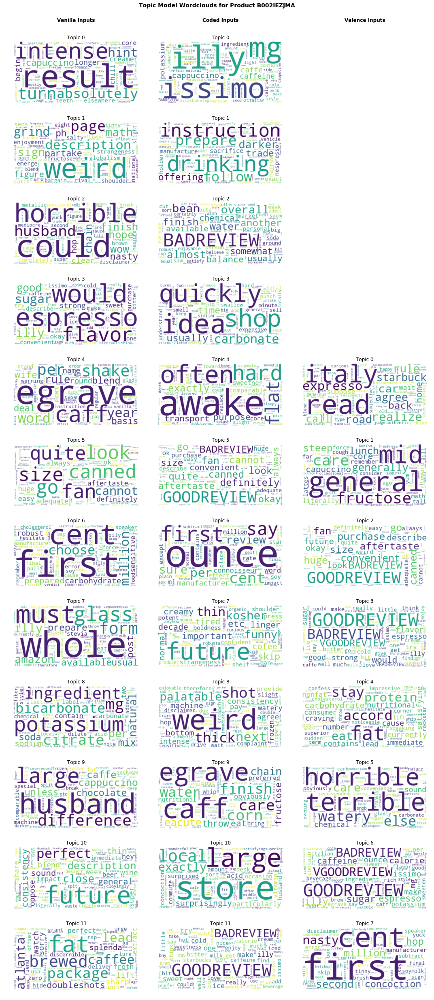

In [23]:
for product in top_ten[0:1]:
    wcv.make_model_wordclouds(product=product, df=df, vanilla_final_results=vanilla_final_results,
                              coded_final_results = coded_final_results,
                              valence_final_results= valence_final_results)

Above are the wordclouds, based on the frequency distribution that defines the topic, for all the topics generated by the three input text sets for the first product. We can pretty easily tell that this is some kind of coffee product, just from looking at these. 

These wordclouds are actually pretty readable, and seem to represent coherent topics. But, remember that these are visualizations of a frequency distribution that serves as a model for generating a bit of text. So when a word appears large, it doesn't mean that this word necessarily occurred frequently in the corpus - it means that, if we were to generate a review using this model (again a distribution of relative frequencies for words), that word would have a high probability of appearing in the generated review. Reading through the clouds, you have wonder how many reviews are actually written that would correspond to some of topics. For example, there are two different topics for the vanilla inputs where the word "husband" is a bizarrely prominent feature. Are there really that many people writing about their husbands in their coffee review on amazon, or is it just that there were a few reviews that included that word, along with some other words that are relatively rare in the corpus, resulting in these topics emerging?

Other things emerge that are related to common difficulties in the data I've got. For example, for many of the food-related products in the review, the review will contain a copy-paste of the entire ingredients list or nutrition information. These tend to prompt a very unique topic to emerge because they appear consistently together, and only together, in the corpus. You can see this with vanilla topic 8 and valence topic 9, though interestingly there isn't really a valence topic like this. 

Let's compare the model wordclouds with the wordclouds from actual reviews that were "generated" by the topics represented above. 

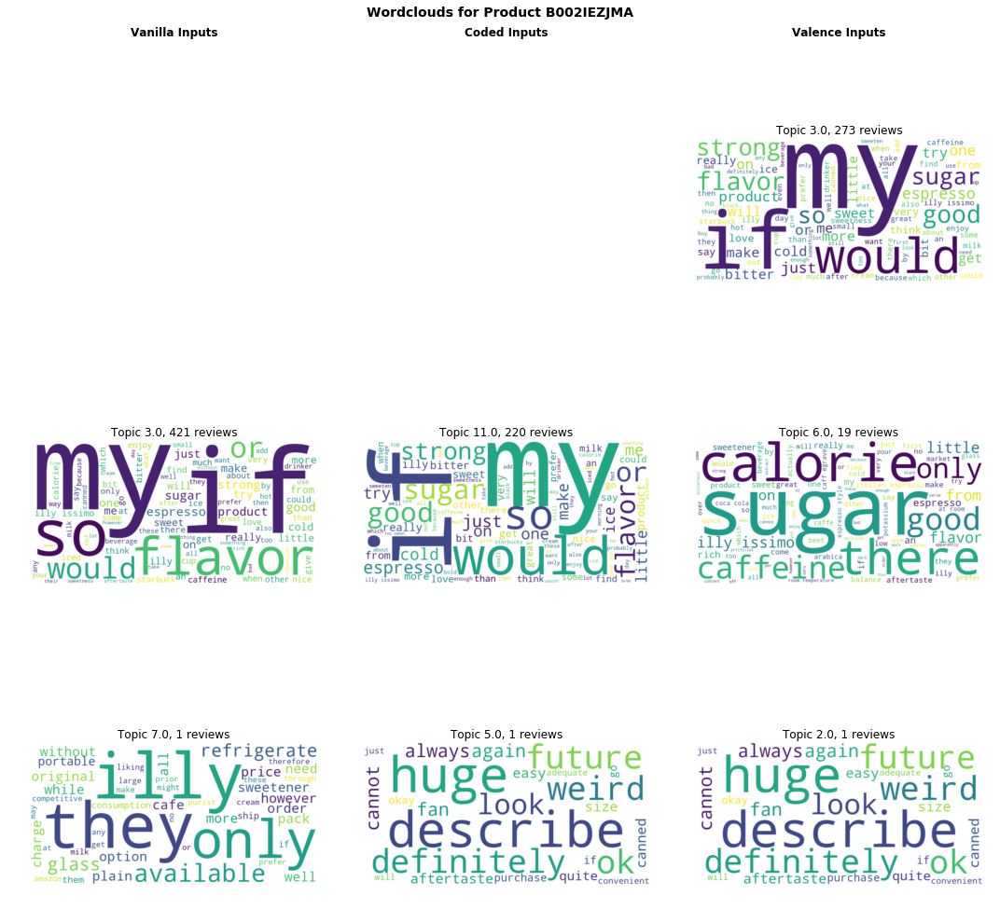

In [26]:
for product in top_ten[0:1]:
    wcv.make_all_wordclouds(product, df, vanilla_final_results, coded_final_results, valence_final_results)

I honestly hoped there were tons of reviews being generated by vanilla topic 2 where the reviewer is talking about how the coffee was so weird and nasty that they and their husband couldn't even finish it, wow! But, sadly, most of the reviews from all three input sets appear to have been generated by the very boring topic where the reviewer is basically saying, this is illy espresso and I bought it and I had some thoughts on the flavor. Which is fair because most of the time there probably isn't much else to be said. 

It's a similar story with the coded and valence inputs, though it appears the valence coding might have been successful in splitting out a slightly more negative set of these basic reviews.

What starts to become clear as you do a few more comparisons is that the topic model wordclouds are more readable and "topic-like," because when we look at wordclouds from the actual reviews we may be getting overwhelmed with things that are closer to stopwords because they're so common, but aren't very meaningful in terms of the topic. However, the review count is critical - so I'll combine the two. We'll still visualize the topic models, but only for the topics that are actually likely to have generated reviews in our corpus. 

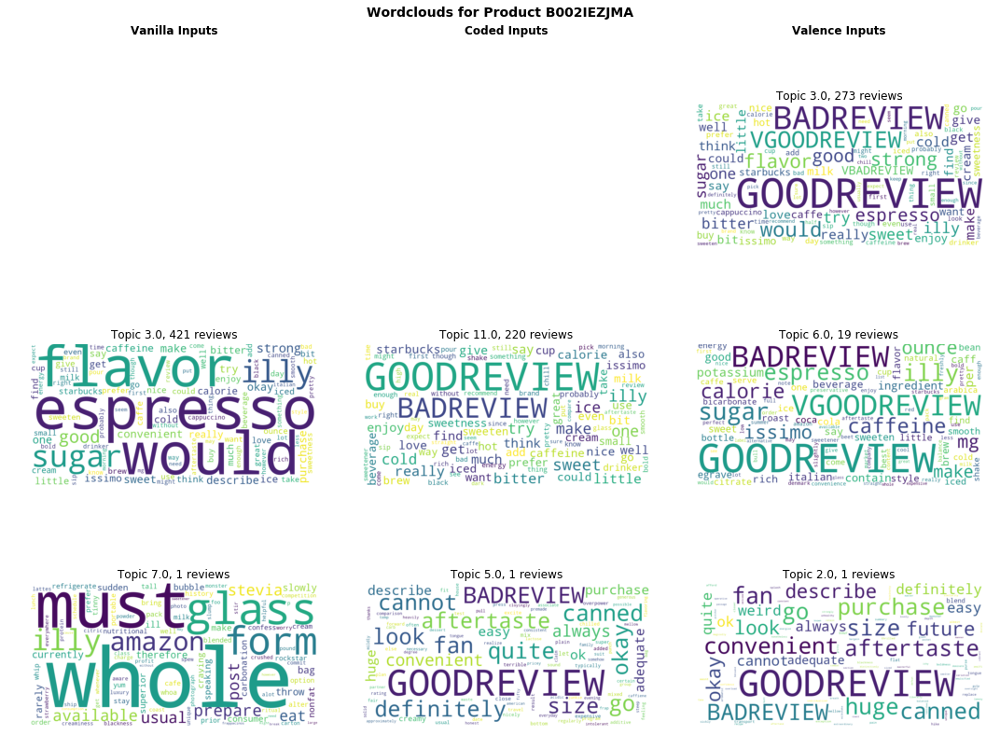

In [27]:
for product in top_ten[0:1]:
    wcv.make_model_wordclouds_review_counts(product, df, 
                                            vanilla_final_results, 
                                            coded_final_results, 
                                            valence_final_results)

So now in the chart above, we can see the wordcloud of the topic model, which indicates which words are most frequently occurring in the topic, along with the number of reviews that were actually classified to that topic. I've added the additional condition that the review have at least a 70% probability of having been generated by the topic in order to get classified to it, not just that it have the max probability of having come from that topic. 

I'll use these charts to document some qualitative commentary on the topic models for each of the ten products. For this first product, there's very little differentiation with any of the input text sets. Only with the valence coded input text do we get a secondary topic of any real size, and it's not very clear from the word cloud how this topic might be distinct aside from more mentions of "sugar," "calorie," and "caffeine." More analysis would be needed to understand the difference between valence topics 3 and 6. 

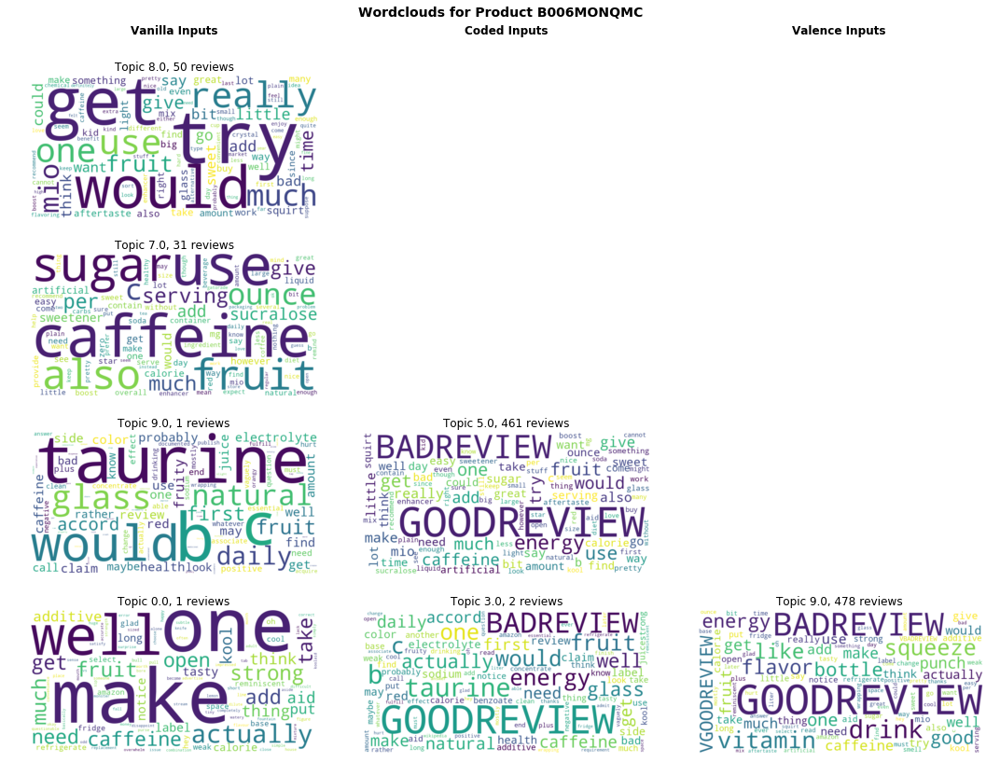

In [28]:
product=top_ten[1]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

This product is a water enhancer - a flavor product you can add to plain water. 

We get the best differentiation with the vanilla inputs, but what is interesting is that very few reviews out of the total 400+ in this product's corpus actually matched to a vanilla topic with >0.7 probability.  

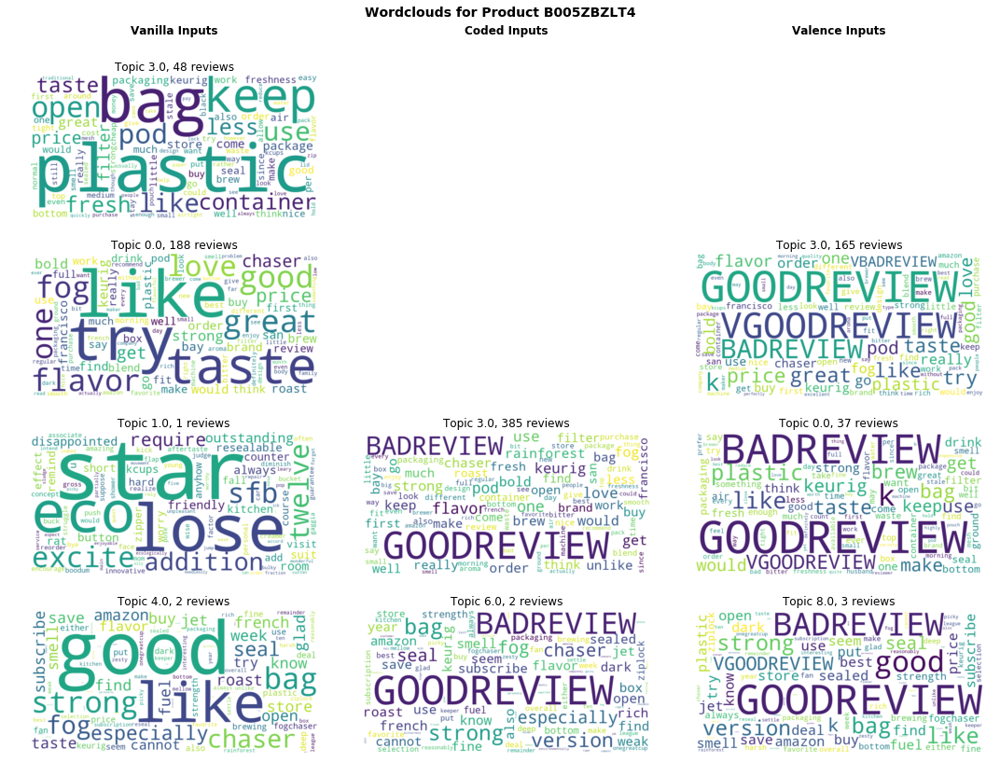

In [29]:
product=top_ten[2]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

This product, which is a plastic coffee pod, also has good topic differentiation with both the vanilla inputs and the valence inputs. With the vanilla inputs, we get a set of reviews about the taste and flavor, and another set that seems to be all about the packaging of the product. This looks possibly to be true with the valence inputs, though it's a little harder to tell visually because of the dominance of the codewords. Unfortunately, everything seems to have gotten mashed together with the coded inputs.

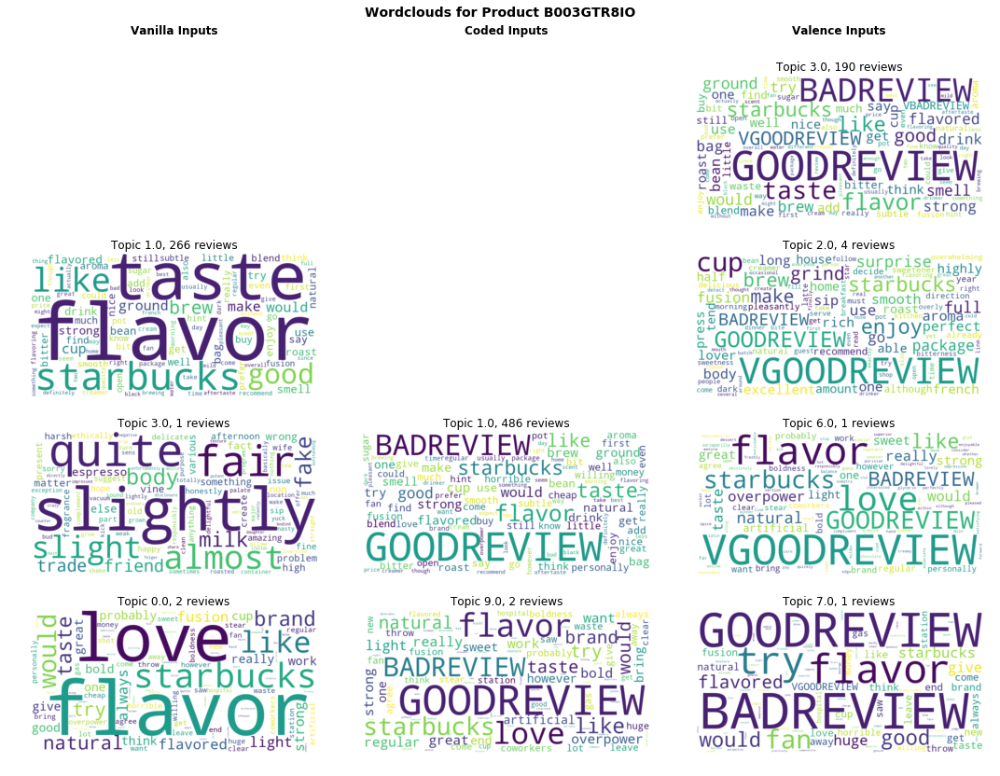

In [30]:
product=top_ten[3]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

Another coffee product! This is either a Starbucks coffee or one that is drawing a lot of comparisons to Starbucks coffe. Vast majority of reviews coming from a single and pretty generic topic in all three input cases.

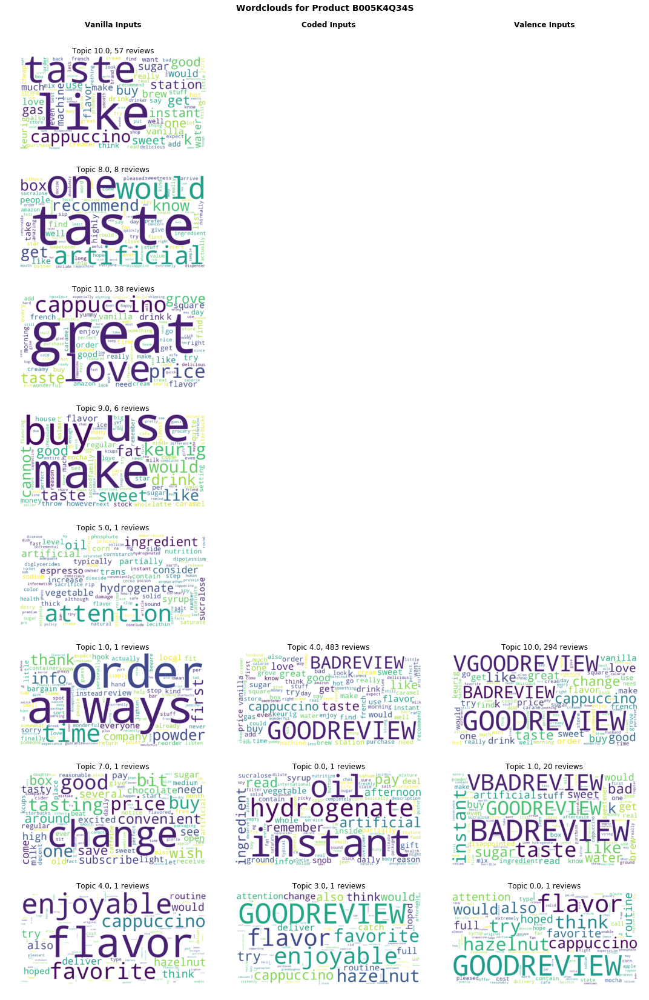

In [31]:
product=top_ten[4]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

Yet another coffee product, this one seems to be a cappuccino product. The valence coding has produced a great result here - there is a topic (1) where the negative codewords figure strongly, and it seems to be primarily about the taste of the product. Such a topic was not represented in either of the other two modeling approaches.

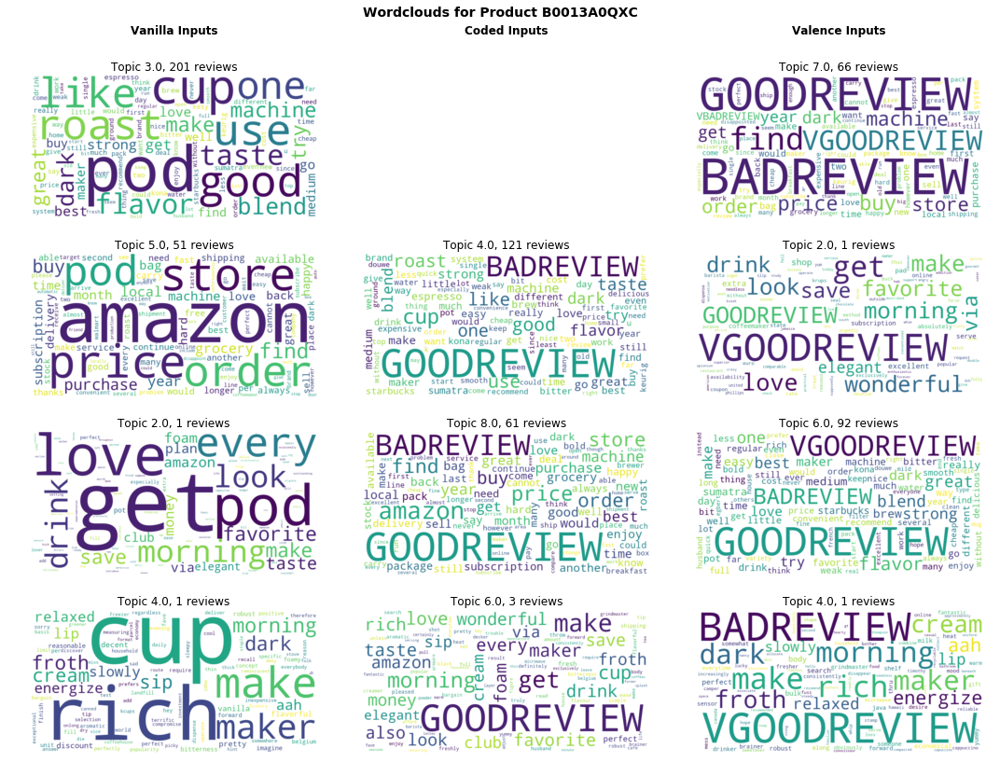

In [32]:
product=top_ten[5]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

Another coffee product. Vanilla models show a couple distinct topics - one about taste, and one about packaging. Again it looks like the valence coding may have been able to separate out a group of negative  (or at least mixed) reviews from positive reviews. Topic 7, which has more negative codeword presence, appears to be about the purchasing experience ("price," "buy," "store," "order"). Topic 6 is more positive and seems to be more focused on the user experience with the product ("flavor," "blend," "strong"). 

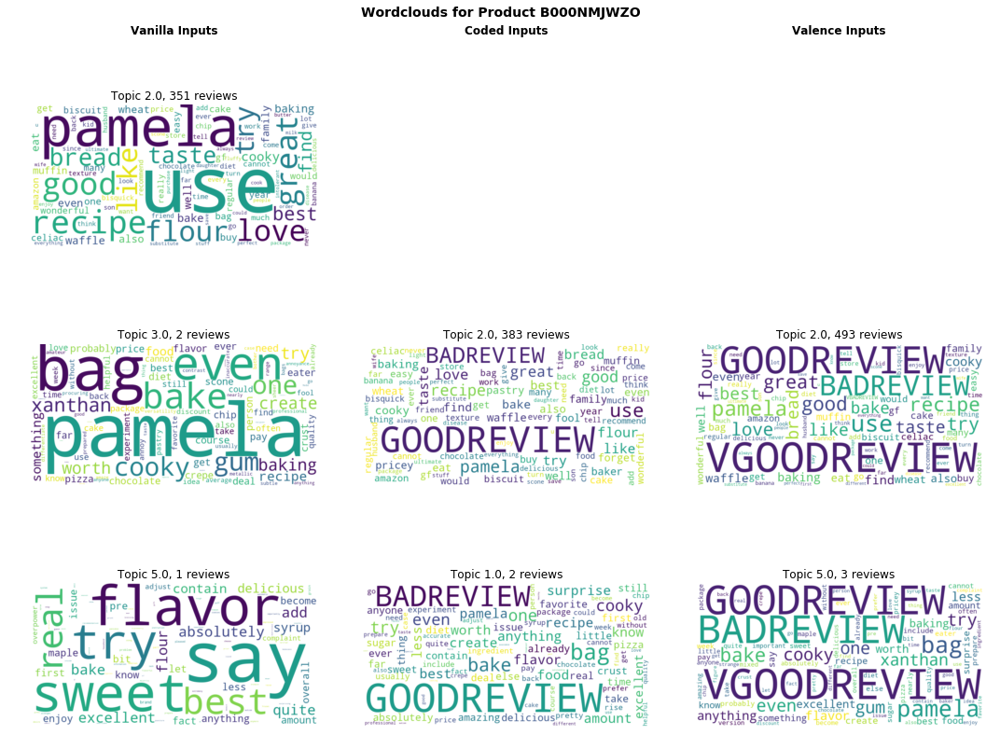

In [33]:
product=top_ten[6]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

It's hard to tell from the wordclouds but this is a gluten-free flour, brand name Pamela's. There's very little topic differentation here - all that is clear is that reviewers are talking about using the flour in various recipes and that they seem to like it. 

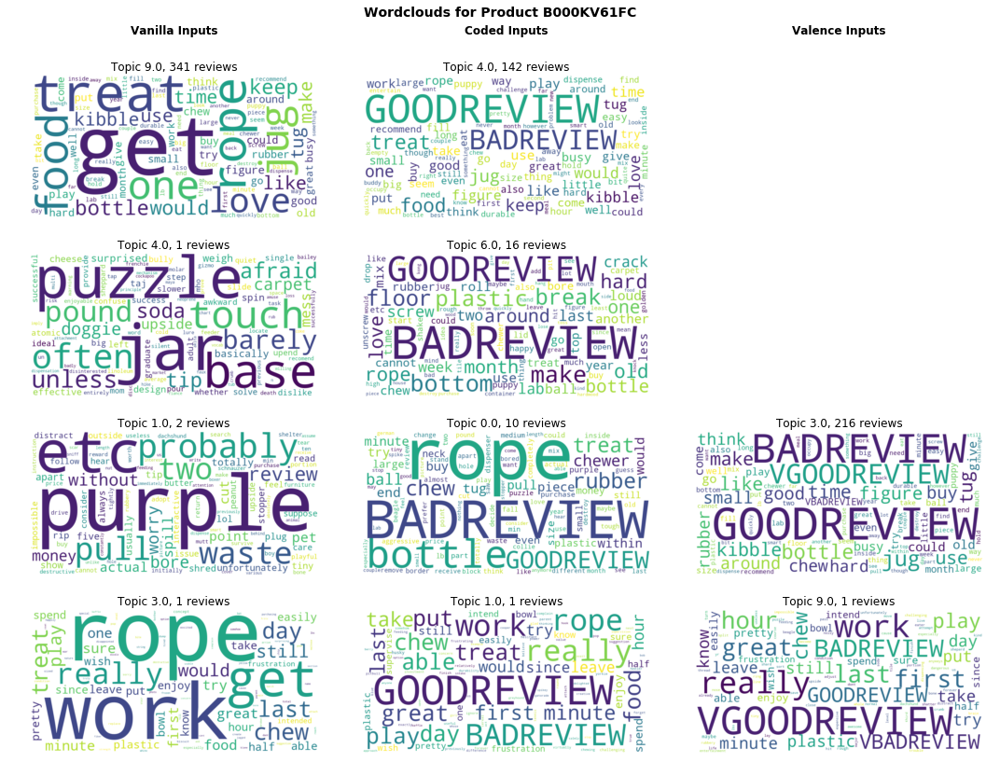

In [34]:
product=top_ten[7]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

This product, a dog chew toy, is the first case where I'm seeing the kind of results I was really hoping for. With vanilla inputs, the reviews mostly match up into a single topic, which is also true for the valence inputs, but the coded inputs produce really nice results in two ways. 

First, there is a good spread of topic assignments - one major topic and two with smaller numbers of reviews. Second, the two smaller topics appear to sentiment driven: the "BADREVIEW" codeword stands out for Topic 6, which seems to be focusing on the durability of the product ("crack," "hard," "break," "last"), and for Topic 0, although it's a little harder to tell what this topic might mean. 

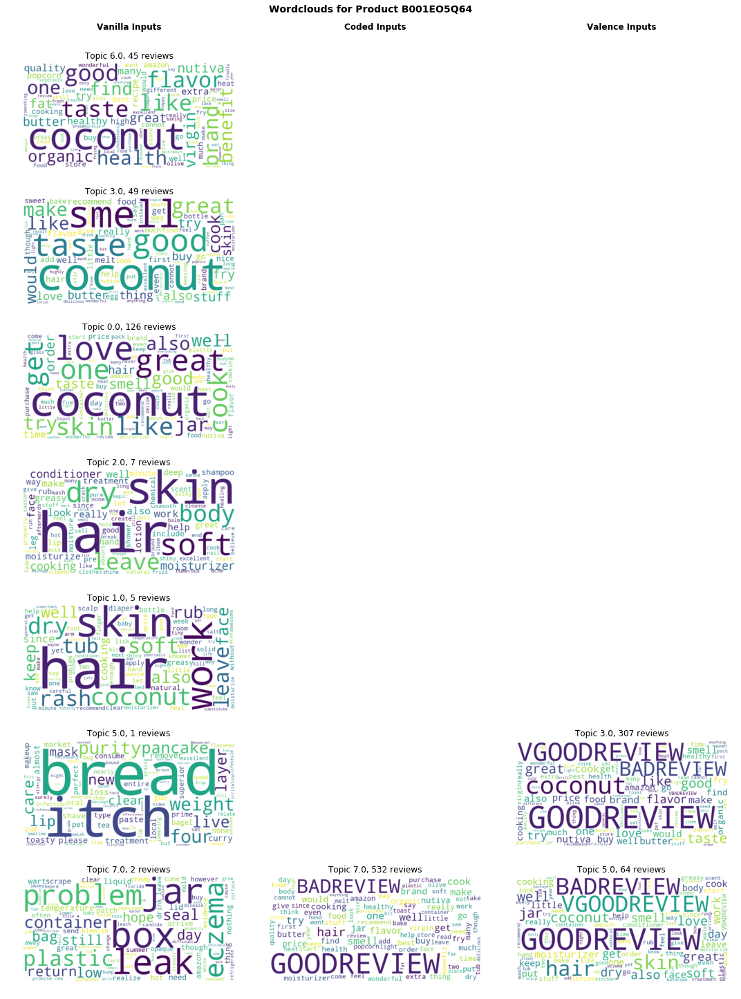

In [35]:
product=top_ten[8]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

This product is a jar of coconut oil. In a few cases, including this one, we see that some extremely common words that didn't get filtered out are actually related to the name of the product. This is because the filtering parameters were chosen in grid optimization, and perhaps the parameters surveyed didn't allow for the exclusion of these words or maybe the coherence was higher while keeping them in (wouldn't be surprising). In future analysis tailored individually to the products, it would probably make sense to remove them. 

The topic differentiation for this coconut oil is best with the vanilla inputs, where there are three main topics. Topic 6 is clearly focused on the healthy attributes of the product, with mentions of "health," "healthy," "benefit," "organic," etc. Topic 3 is all about the oil as a cooking ingredient, mentioning "smell," "taste," "great," "cook," etc. Topic 0 is a little bit more of a mishmash with words including "skin," "jar," "cook," "order," "skin," "taste," "smell." It appears to be a topic about using the oil for multiple purposes. There are a couple less-represented topics that are clearly about using the oil as a hair conditioner and skin moisturizer. 

Unfortunately there is nothing so interesting the results from the coded inputs - just one big topic that may have been overwhelmed by the "GOODREVIEW" codeword. 

The valence inputs grouped reviews into two main topics, one that looks to be mostly about the product attributes ("brand," "price," "jar," "nutiva," "organic") and cooking ("taste," "butter," "cook," "flavor") and the other including terms about using it as both a cooking ingredient and a beauty product ("dry," "body," "moisturizer," "hair," "face," "soft," "skin"). 

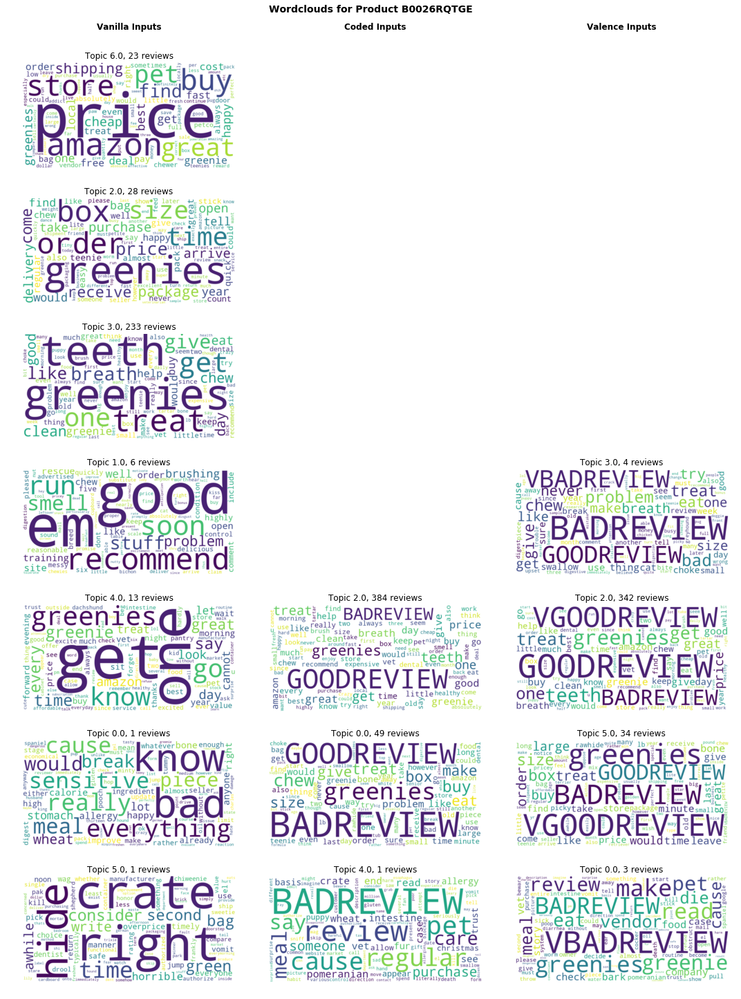

In [36]:
product=top_ten[9]
wcv.make_model_wordclouds_review_counts(product, df, 
                                        vanilla_final_results, 
                                        coded_final_results, 
                                        valence_final_results)

This product has perhaps the most interesting results of the bunch. The product is a dog treat called "greenies" for their color. The word "greenies" frequently appears in the wordclouds - it likely produced higher coherence among the topic when left in. 

With the vanilla inputs, we get three primary topics. Topic 6 clearly appears to discuss buying these treats on amazon.com vs at a pet store, and likely with a comparison of the price and the convenience. Topic 0 seems to be about the purchase experience on Amazon, and Topic 3 is focused on the effects of the treats on the teeth and breath of the dogs. 

With the coded topics, we seem to get slightly less variety in topics, but we do get what looks like a split between positive and negative reviews. Topic 2 has a strong positive codeword presence, and seems similar to vanilla Topic 3 about breath, teeth, and "clean." Coded Topic 0 however shows more negative codewords and mentions "time," "box," "size," "problem," "time," and "minute" - could this be complaints about the size of the treats and how long they last?

The valence coded inputs are the most interesting. At first it looks like we just have two main topics - 2 and 5. Topic 2 looks like it's mostly positive, and mentions "teeth," "breath," "clean." Topic 5 is also mostly positive and is more focused on purchasing experience ("order," "size," "large," "box," "buy," "price"). The other two topics have very few reviews assigned to them and you might just pass them over - until you take a closer look. Topic 3 is dominated by negative codewords, which is unusual, and includes the words "problem," "bad," "choke," "bite," "cat," and "swallow." This sounds like reviews where the customer is reporting a bad outcome with their pet and the treat. Topic 0, with just three reviews, is even more unusual because it is dominated by the "VBADREVIEW" codeword. There aren't many of the very negative codewords that ever appear in the reviews so this stands out right away. Then you see the word "die" along with "vendor," "company," and "obstruct" (if you look really closely). This is describing some very bad outcomes indeed. 

This product shows a really interesting potential use case for topic modeling - as an early warning or detection system for quality or safety issues with a product. The number of reviews for each of these topics is very small, but the content of them looks like it is quite serious - having ongoing topic modeling analysis of online reviews for a product could allow the vendor to detect and respond to these issues as they happen and even understand if there is a widespread issue emerging. 

#### N-Gram Analysis

To assess topic quality and try to answer the question, "what is this topic about?" I will introduce a few new things, including the concept of n-grams. An n-gram is a set of n words that occur together within a document - typically NLP analyses are focused on bigrams or trigrams. We are interested in n-grams that give a picture of what is being talked about in a document. 

There are many different ways to determine which n-grams from a document or set of documents are the most "important." One way is simply the frequency with which the n words occur together; other ways attempt to evaluate how much information the group of words is conveying when they appear together. Both could be relevant in this analysis. 

In [ ]:
toy = valence_topic_data.loc[(valence_topic_data['product']=='B005K4Q34S')&
                             (valence_topic_data['review_count']>10)]
toy.loc[toy['topic']==4]['review_count']

In [ ]:
for product in top_ten[1:2]:
    print('Product {}'.format(product))
    print('Valence Coded Reviews')
    data = valence_topic_data[valence_topic_data['product']==product]
    for topic in data['topic'].unique():
        if data.iloc[topic]['review_count']>10:
            print('Topic {}'.format(topic))
            print('Reviews: {}'.format(data.iloc[topic]['review_count']))
            print('Topic Coherence: {}'.format(data.iloc[topic]['topic_coherence']))
            print('Top Words: {}'.format(data.iloc[topic]['top_words']))
            print('Best Review, fit {}: {}'.format(data.iloc[topic]['best_review_fit'], 
                                                   data.iloc[topic]['best_review']))
            print()

In [ ]:
for product in top_ten[0:1]:
    data = vanilla_topic_data[vanilla_topic_data['product']==product]
    #y = data['topic coherence']
    #x = data['best review fit']
    
    # for display purposes, take the log of the review count so the chart is visually readable
    data['review_count_transformed'] = np.log(data['review_count'].astype(int))*10
    
    source = ColumnDataSource(data)
    p = figure(x_range=(0,1.2), y_range=(0,1.2), 
               plot_height=400, plot_width=400)
    p.circle(x='topic_coherence', y='best_review_fit', 
             size='review_count_transformed', 
             source=source, line_color='white')
    p.yaxis.axis_label='Topic Coherence'
    p.xaxis.axis_label='Best Review Fit'
    
    p.add_tools(HoverTool(tooltips=[('Topic','@topic'), 
                                    ('Reviews', '@review_count'), 
                                    ('Bigrams', '@top_bigrams_pmi'),
                                    ('Trigrams','@top_trigrams_pmi')]))

    show(p)

In [ ]:
def get_assign_distrib(df, encoding_type):
    data_topics = df['{} Topic'.format(encoding_type)].value_counts()
    data_subtopics = df['{} Subtopic'.format(encoding_type)].value_counts()
    topics = ['Topic {}'.format(t) for t in data_topics.index]
    subtopics = ['Subtopic {}'.format(t) for t in data_subtopics.index]
    topic_counts = np.array(data_topics.values)
    subtopic_counts = np.array(data_subtopics.values)
    return topics, topic_counts, subtopics, subtopic_counts

def plot_topic_distribution_with_subtopics(df, product):
    """
    Plots a bar chart for each encoding type (vanilla, coded, valence coded) 
    to show the distribution of reviews assigned to each topic. 

    :param DataFrame df: the main dataframe containing product IDs 
                         and all review encoding sets
    :param str product: the product for which we are plotting

    :return: a bokeh gridplot object with 3 charts, one for each encoding type
    :rtype: bokeh gridplot
    """
    # get a subset of the df containing only the needed data
    data = df[df['ProductId']==product][['ProductId', 'Vanilla Topic', 
                                         'Coded Topic', "Valence Topic",
                                        'Vanilla Subtopic', 'Coded Subtopic',
                                        'Valence Subtopic']]
    
    # for each encoding type, get the distribution of topic assignments and store in an array
    
    vanilla_topics, vanilla_counts, vanilla_subtopics, vanilla_subcounts = get_assign_distrib(data, "Vanilla")
    coded_topics, coded_counts, coded_subtopics, coded_subcounts = get_assign_distrib(data, "Coded")
    valence_topics, valence_counts, valence_subtopics, valence_subcounts = get_assign_distrib(data, "Valence")

    
    # create a CDS for each of the encoding types
    source_vanilla = ColumnDataSource(data={'Vanilla Topics': vanilla_topics, 
                                            'Review Counts': vanilla_counts,
                                            'Vanilla Subtopics': vanilla_subtopics,
                                            'Subtopic Review Counts': vanilla_subcounts})
    source_coded = ColumnDataSource(data={'Coded Topics': coded_topics, 
                                          'Review Counts': coded_counts,
                                         'Coded Subtopics': coded_subtopics,
                                         'Subtopic Review Counts': coded_subcounts})
    source_valence = ColumnDataSource(data={'Valence Topics': valence_topics, 
                                             'Review Counts': valence_counts,
                                           'Valence Subtopics': valence_subtopics,
                                           'Subtopic Review Counts': valence_subcounts})


    
    # create a figure for each encoding type showing the distribution of review assignments
    l = figure(x_range=vanilla_topics, plot_height=300, y_range=(0,550), 
               plot_width=325, toolbar_location=None, 
               title='Vanilla Topic Distribution for Product {}'.format(product))
    l.vbar(x=dodge('Vanilla Topics', 0.0, range=l.x_range), 
           top='Review Counts', width=0.7, source=source_vanilla)
    l.vbar(x=dodge('Vanilla Subtopics', 0.25, range=l.x_range), 
           top='Subtopic Review Counts', width=0.7, source=source_vanilla)
    l.title.text_font_size='9pt'
    l.xaxis.major_label_orientation = 0.75
    
    c = figure(x_range=coded_topics, plot_height=300, y_range=(0,550), 
              plot_width=325, toolbar_location=None, 
              title='Coded Topic Distibution for Product {}'.format(product))
    c.vbar(x='Coded Topics', top='Review Counts', width=0.9, source=source_coded)
    c.title.text_font_size='9pt'
    c.xaxis.major_label_orientation = 0.75

    
    r = figure(x_range=valence_topics, plot_height=300, y_range=(0,550), 
              plot_width=325, toolbar_location=None, 
              title='Valence Topic Distibution for Product {}'.format(product))
    r.vbar(x='Valence Topics', top="Review Counts", width=0.9, source=source_valence)
    r.title.text_font_size='9pt'
    r.xaxis.major_label_orientation = 0.75

    # lay the three charts out in a grid
    grid = gridplot([[l, c, r]])
    return grid

In [ ]:
for product in top_ten[0:1]:
    grid = plot_topic_distribution_with_subtopics(df, product)
    show(grid)

In [ ]:
def get_assign_distrib(df, encoding_type):
    data_topics = df['{} Topic'.format(encoding_type)].value_counts()
    data_subtopics = df['{} Subtopic'.format(encoding_type)].value_counts()
    topics = ['Topic {}'.format(t) for t in data_topics.index]
    subtopics = ['Subtopic {}'.format(t) for t in data_subtopics.index]
    topic_counts = np.array(data_topics.values)
    subtopic_counts = np.array(data_subtopics.values)
    return data_topics, data_subtopics, topics, topic_counts, subtopics, subtopic_counts

In [37]:
from sklearn.linear_model import LinearRegression, LogisticRegression

In [13]:
import ast

In [42]:
X = vanilla_regression[[x for x in range(vanilla_final_results.loc['B000KV61FC', 'num_topics'])]]
#X = vanilla_regression[['codecount_GOOD', 'codecount_BAD']]
y = vanilla_regression['Score']
reg = LogisticRegression().fit(X, y)

In [43]:
reg.score(X, y)

0.3579136690647482

In [26]:
coded_regression = toy[['Topic Mixtures Coded', 'Score']]
for t in range(coded_final_results.loc['B000KV61FC', 'num_topics']):
    coded_regression[t] = coded_regression['Topic Mixtures Coded'].apply(lambda x: ast.literal_eval(x)[t])

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [40]:
X = coded_regression[[x for x in range(coded_final_results.loc['B000KV61FC', 'num_topics'])]]
y = coded_regression['Score']
reg = LogisticRegression().fit(X, y)
reg.score(X, y)

0.4010791366906475

In [46]:
valence_regression = toy[['Topic Mixtures Valence', 'Score']]
for t in range(valence_final_results.loc['B000KV61FC', 'num_topics']):
    valence_regression[t] = valence_regression['Topic Mixtures Valence'].apply(lambda x: ast.literal_eval(x)[t])
    
X = valence_regression[[x for x in range(valence_final_results.loc['B000KV61FC', 'num_topics'])]]
y = valence_regression['Score']
reg = LogisticRegression().fit(X, y)
reg.score(X, y)

/Users/hannahmoran/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


0.35431654676258995

In [25]:
valence_topic_data

,Unnamed: 0,product,topic,review_count,topic_coherence,top_words,best_review,best_review_fit,top_bigrams_pmi,top_bigrams_freq,top_trigrams_pmi,top_trigrams_freq
0,0,B002IEZJMA,0,0,0.636215,"['read', 'italy', 'expresso', 'realize', 'car'...",none,NaN,[],[],[],[]
1,1,B002IEZJMA,1,0,0.601185,"['general', 'mid', 'fructose', 'care', 'genera...",none,NaN,[],[],[],[]
2,2,B002IEZJMA,2,1,0.591421,"['GOODREVIEW', 'fan', 'convenient', 'BADREVIEW...","i am not a huge fan of canned coffee drinks, b...",0.966343,"['i am', 'i not', 'is .']",['is .'],[],[]
3,3,B002IEZJMA,3,417,0.568374,"['GOODREVIEW', 'BADREVIEW', 'VGOODREVIEW', 'wo...",illy coffee is not new to me. i have been buyi...,0.994315,"['gas station', 'nowhere near', 'final verdict...","[', i', '. it', ', but', 'i not', 'coffee .', ...","['fructose corn syrup', ': 1:50 mins', 'length...","['. i not', '. if you', 'i do not', '. this is..."
4,4,B002IEZJMA,4,0,0.538095,"['fat', 'stay', 'accord', 'protein', 'eat', 'c...",none,NaN,[],[],[],[]
5,5,B002IEZJMA,5,0,0.399497,"['terrible', 'horrible', 'watery', 'else', 'ca...",none,NaN,[],[],[],[]
6,6,B002IEZJMA,6,69,0.349213,"['GOODREVIEW', 'BADREVIEW', 'VGOODREVIEW', 'su...","as you can tell from my user name, i am a bit ...",0.988631,"['turkey gravy', '200 ml', 'husband loves', 't...","['. the', ', i', 'coffee ,', '. it', '. is', '...","['want diet controlled', 'high fructose corn',...","['caff & ;', 'caff & egrave', 'caff egrave ;',..."
7,7,B002IEZJMA,7,0,0.148709,"['first', 'cent', 'nasty', 'second', 'million'...",none,NaN,[],[],[],[]
8,0,B006MONQMC,0,1,0.701677,"['b', 'taurine', 'c', 'vitamin', 'glass', 'dai...",or so the bottle wrapping claims and there is ...,0.472257,"['first glass', 'my first', 'my glass', 'would...","[""' i"", ', according', ', it', ', to', '. i', ...","['my first glass', '. i not', ', according to']",['my first glass']
9,1,B006MONQMC,1,0,0.621784,"['morning', 'sport', 'set', 'load', 'person', ...",none,NaN,[],[],[],[]
